## Import Libraries

In [9]:
#Basic libraries
import pandas as pd 
import numpy as np 


#NLTK libraries
import nltk
import re
import string
from wordcloud import WordCloud,STOPWORDS
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer

# Machine Learning libraries
import sklearn 
from sklearn.svm import SVC
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import BernoulliNB 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn import svm, datasets
from sklearn import preprocessing 


#Metrics libraries
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve, auc

#Visualization libraries
import matplotlib.pyplot as plt 
from matplotlib import rcParams
import seaborn as sns
from textblob import TextBlob
from plotly import tools
import plotly.graph_objs as go
from plotly.offline import iplot
%matplotlib inline

#Ignore warnings
import warnings
warnings.filterwarnings('ignore')

#Other miscellaneous libraries
from scipy import interp
from itertools import cycle
import cufflinks as cf
from collections import defaultdict
from collections import Counter
from imblearn.over_sampling import SMOTE

#Spacy library for NER
import spacy
from spacy import displacy

## Import Dataset

In [10]:
# amazon_review_data = pd.read_csv('./data_old.csv')

# Download Amazon Gift Cards complete review data here: https://drive.google.com/file/d/1WWQdUfpZL4HLROMg-2yRHD7T1t9uSKMK/view
amazon_review_data = pd.read_json('./data.json', lines=True)

amazon_review_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147194 entries, 0 to 147193
Data columns (total 12 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   overall         147194 non-null  int64 
 1   vote            6341 non-null    object
 2   verified        147194 non-null  bool  
 3   reviewTime      147194 non-null  object
 4   reviewerID      147194 non-null  object
 5   asin            147194 non-null  object
 6   style           42375 non-null   object
 7   reviewerName    147190 non-null  object
 8   reviewText      147035 non-null  object
 9   summary         147154 non-null  object
 10  unixReviewTime  147194 non-null  int64 
 11  image           406 non-null     object
dtypes: bool(1), int64(2), object(9)
memory usage: 12.5+ MB


## Remove unnecessary columns

In [11]:
#Creating a copy
process_reviews=amazon_review_data.copy()

#Remove unnecessary columns
process_reviews = process_reviews.drop('verified', axis=1)
process_reviews = process_reviews.drop('reviewerID', axis=1)
process_reviews = process_reviews.drop('reviewTime', axis=1)
process_reviews = process_reviews.drop('asin', axis=1)
process_reviews = process_reviews.drop('reviewerName', axis=1)
process_reviews = process_reviews.drop('vote', axis=1)

# For new data
process_reviews = process_reviews.drop('style', axis=1)
process_reviews = process_reviews.drop('image', axis=1)
process_reviews = process_reviews.drop('unixReviewTime', axis=1)

# For old data
# process_reviews = process_reviews.drop('style/Size:', axis=1)
# process_reviews = process_reviews.drop('style/Style:', axis=1)
# process_reviews = process_reviews.drop('style/Size Name:', axis=1)
# process_reviews = process_reviews.drop('style/Color:', axis=1)
# process_reviews = process_reviews.drop('style/Style Name:', axis=1)
# process_reviews = process_reviews.drop('style/Package Quantity:', axis=1)
# process_reviews = process_reviews.drop('image/0', axis=1)
# process_reviews = process_reviews.drop('image/1', axis=1)
# process_reviews = process_reviews.drop('image/2', axis=1)
# process_reviews = process_reviews.drop('image/3', axis=1)
# process_reviews = process_reviews.drop('image/4', axis=1)
# process_reviews = process_reviews.drop('image/5', axis=1)
# process_reviews = process_reviews.drop('image/6', axis=1)
# process_reviews = process_reviews.drop('image/7', axis=1)

process_reviews.head()

,overall,reviewText,summary
0,1,"Amazon,\nI am shopping for Amazon.com gift car...",Merry Christmas.
1,5,"I got this gift card from a friend, and it was...",Gift card with best selection
2,5,aren't we going to save trees?! :) People who ...,A convenient and great gift for the environmen...
3,5,You can always get someone something from Amaz...,Totally make sense
4,1,Why take 50 dollars of good money with no limi...,Give CASH!


In [12]:
#Checking for null values
process_reviews.isnull().sum()

overall         0
reviewText    159
summary        40
dtype: int64

In [13]:
process_reviews['reviewText']=process_reviews['reviewText'].fillna('Missing')

## Concatenating review text and summary

In [14]:
process_reviews['reviews']=process_reviews['reviewText']+' '+process_reviews['summary']
process_reviews=process_reviews.drop(['reviewText', 'summary'], axis=1)
process_reviews.head()

,overall,reviews
0,1,"Amazon,\nI am shopping for Amazon.com gift car..."
1,5,"I got this gift card from a friend, and it was..."
2,5,aren't we going to save trees?! :) People who ...
3,5,You can always get someone something from Amaz...
4,1,Why take 50 dollars of good money with no limi...


## Creating 'sentiment' column

In [15]:
def f(row):
    
    '''This function returns sentiment value based on the overall ratings from the user'''
    
    if row['overall'] == 3.0:
        val = 'Neutral'
    elif row['overall'] > 0.0 and row['overall'] <= 2.0:
        val = 'Negative'
    elif row['overall'] > 2.0 and row['overall'] < 3.0:
        val = 'Neutral-Negative'
    elif row['overall'] > 3.0 and row['overall'] <= 4.0:
        val = 'Neutral-Positive'
    elif row['overall'] > 4.0 and row['overall'] <= 5.0:
        val = 'Positive'
    else:
        val = -1
    return val

In [16]:
#Applying the function in our new column
process_reviews['sentiment'] = process_reviews.apply(f, axis=1)
process_reviews.head(10)

,overall,reviews,sentiment
0,1,"Amazon,\nI am shopping for Amazon.com gift car...",Negative
1,5,"I got this gift card from a friend, and it was...",Positive
2,5,aren't we going to save trees?! :) People who ...,Positive
3,5,You can always get someone something from Amaz...,Positive
4,1,Why take 50 dollars of good money with no limi...,Negative
5,3,Gift Cards are the truly personal gift. My on...,Neutral
6,1,"I am a dedicated Amazon.com shopper, and, am a...",Negative
7,1,"Bought three $50 gift cards as gifts, received...",Negative
8,5,At this time of year Amazon gift cards are tur...,Positive
9,1,I bought 8 gift cards to give out as presents....,Negative


In [17]:
process_reviews['sentiment'].value_counts()

Positive            126689
Negative              8809
Neutral-Positive      8700
Neutral               2996
Name: sentiment, dtype: int64

## Review text-Punctuation Cleaning

In [18]:
def review_cleaning(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

In [19]:
process_reviews['reviews']=process_reviews['reviews'].apply(lambda x:review_cleaning(x))
process_reviews.head()

,overall,reviews,sentiment
0,1,amazoni am shopping for amazoncom gift cards f...,Negative
1,5,i got this gift card from a friend and it was ...,Positive
2,5,arent we going to save trees people who were ...,Positive
3,5,you can always get someone something from amaz...,Positive
4,1,why take dollars of good money with no limita...,Negative


## Review text-Stop words

In [20]:
stop_words= ['yourselves', 'between', 'whom', 'itself', 'is', "she's", 'up', 'herself', 'here', 'your', 'each', 
             'we', 'he', 'my', "you've", 'having', 'in', 'both', 'for', 'themselves', 'are', 'them', 'other',
             'and', 'an', 'during', 'their', 'can', 'yourself', 'she', 'until', 'so', 'these', 'ours', 'above', 
             'what', 'while', 'have', 're', 'more', 'only', "needn't", 'when', 'just', 'that', 'were', "don't", 
             'very', 'should', 'any', 'y', 'isn', 'who',  'a', 'they', 'to', 'too', "should've", 'has', 'before',
             'into', 'yours', "it's", 'do', 'against', 'on',  'now', 'her', 've', 'd', 'by', 'am', 'from', 
             'about', 'further', "that'll", "you'd", 'you', 'as', 'how', 'been', 'the', 'or', 'doing', 'such',
             'his', 'himself', 'ourselves',  'was', 'through', 'out', 'below', 'own', 'myself', 'theirs', 
             'me', 'why', 'once',  'him', 'than', 'be', 'most', "you'll", 'same', 'some', 'with', 'few', 'it',
             'at', 'after', 'its', 'which', 'there','our', 'this', 'hers', 'being', 'did', 'of', 'had', 'under',
             'over','again', 'where', 'those', 'then', "you're", 'i', 'because', 'does', 'all']

In [21]:
process_reviews['reviews'] = process_reviews['reviews'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))
process_reviews.head()

,overall,reviews,sentiment
0,1,amazoni shopping amazoncom gift cards christma...,Negative
1,5,got gift card friend best site much choose gre...,Positive
2,5,arent going save trees people complaining pape...,Positive
3,5,always get someone something amazon safety net...,Positive
4,1,take dollars good money no limitations turn am...,Negative


## NER with Spacy

In [22]:
NER = spacy.load("en_core_web_sm")

def nerSpacyWithDisplacyFunc(text):
    result= NER(text)
    print('---------------------------------------')
    displacy.render(result,style="ent",jupyter=True)
    
def nerSpacyFunc(text):
    result= NER(text)
    return len(result.ents)

def nerSpacyTextLenFunc(text):
    result= NER(text)
    entLen = 0
    for ent in result.ents:
        entLen = entLen + len(ent.text.split())
    return entLen

def commentLenFunc(text):
    return len(text.split())

def removeNersWithPrintFunc(text):
    result= NER(text)
    newText = text
    print(text)
    for ent in result.ents:
        print(ent.text)
        newText = newText.replace(ent.text + ' ', '') 
    print(newText)

    print(len(text.split()))
    print(len(result.ents))
    print(nerSpacyTextLenFunc(text))
    print(len(newText.split()))
    

def removeNersFunc(text):
    result= NER(text)
    newText = text
    for ent in result.ents:
        newText = newText.replace(ent.text + ' ', '')
    return newText
    


In [23]:
for review in process_reviews['reviews'].values[0:1]:
    removeNersWithPrintFunc(review)

amazoni shopping amazoncom gift cards christmas gifts really disappointed five choices isnt one says merry christmas mentions christmas sure not alone wanting card reflects actual holiday celebrating principle cannot send amazon gift card christmas whats political correctness bad marketing decisionlynn merry christmas
amazoni shopping amazoncom gift
christmas
five
christmas
christmas
christmas
christmas
cards gifts really disappointed choices isnt one says merry mentions sure not alone wanting card reflects actual holiday celebrating principle cannot send amazon gift card whats political correctness bad marketing decisionlynn merry christmas
42
7
10
33


In [24]:
process_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 147194 entries, 0 to 147193
Data columns (total 3 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   overall    147194 non-null  int64 
 1   reviews    147194 non-null  object
 2   sentiment  147194 non-null  object
dtypes: int64(1), object(2)
memory usage: 3.4+ MB


In [25]:
process_reviews['comment_length'] = process_reviews['reviews'].map(lambda text: commentLenFunc(text))

In [26]:
process_reviews['ner_text_length'] = process_reviews['reviews'].map(lambda text: nerSpacyTextLenFunc(text))

In [27]:
# process_reviews['ner_length'] = process_reviews['reviews'].map(lambda text: nerSpacyFunc(text))
print('test')

test


In [28]:

totalCommentLen = process_reviews['comment_length'].sum()
# totalNerLen = process_reviews['ner_length'].sum()
totalNerTextLen = process_reviews['ner_text_length'].sum()
print('Total Words in Comments')
print(totalCommentLen)
print('Total Words in Ners')
print(totalNerTextLen)

print('Total Words Without Ners')
totalWithoutNerLen = totalCommentLen - totalNerTextLen
print(totalWithoutNerLen)

Total Words in Comments
1822633
Total Words in Ners
123462
Total Words Without Ners
1699171


In [29]:
process_reviews['reviews_nerRemoved'] = process_reviews['reviews'].map(lambda text: removeNersFunc(text))

In [30]:
process_reviews.head(15)

,overall,reviews,sentiment,comment_length,ner_text_length,reviews_nerRemoved
0,1,amazoni shopping amazoncom gift cards christma...,Negative,42,10,cards gifts really disappointed choices isnt o...
1,5,got gift card friend best site much choose gre...,Positive,14,0,got gift card friend best site much choose gre...
2,5,arent going save trees people complaining pape...,Positive,70,0,arent going save trees people complaining pape...
3,5,always get someone something amazon safety net...,Positive,25,0,always get someone something amazon safety net...
4,1,take dollars good money no limitations turn am...,Negative,39,0,take dollars good money no limitations turn am...
5,3,gift cards truly personal gift problem receive...,Neutral,54,1,gift cards truly personal gift problem receive...
6,1,dedicated amazoncom shopper almost always happ...,Negative,30,1,dedicated amazoncom shopper almost always happ...
7,1,bought three gift cards gifts received mailed ...,Negative,50,5,bought gift cards gifts received mailed letter...
8,5,time year amazon gift cards turning best gifts...,Positive,20,1,time amazon gift cards turning best gifts give...
9,1,bought gift cards give presents totally surpri...,Negative,66,0,bought gift cards give presents totally surpri...


## More features for text analysis

Polarity: We use Textblob for for figuring out the rate of sentiment . It is between [-1,1] where -1 is negative and 1 is positive polarity

Review length: length of the review which includes each letters and spaces

Word length: This measures how many words are there in review

In [31]:
process_reviews['polarity'] = process_reviews['reviews'].map(lambda text: TextBlob(text).sentiment.polarity)
process_reviews['review_len'] = process_reviews['reviews'].astype(str).apply(len)
process_reviews['word_count'] = process_reviews['reviews'].apply(lambda x: len(str(x).split()))

In [32]:
process_reviews.head(10)

,overall,reviews,sentiment,comment_length,ner_text_length,reviews_nerRemoved,polarity,review_len,word_count
0,1,amazoni shopping amazoncom gift cards christma...,Negative,42,10,cards gifts really disappointed choices isnt o...,-0.190000,319,42
1,5,got gift card friend best site much choose gre...,Positive,14,0,got gift card friend best site much choose gre...,0.750000,78,14
2,5,arent going save trees people complaining pape...,Positive,70,0,arent going save trees people complaining pape...,0.257143,468,70
3,5,always get someone something amazon safety net...,Positive,25,0,always get someone something amazon safety net...,0.000000,155,25
4,1,take dollars good money no limitations turn am...,Negative,39,0,take dollars good money no limitations turn am...,0.200000,276,39
5,3,gift cards truly personal gift problem receive...,Neutral,54,1,gift cards truly personal gift problem receive...,0.312121,335,54
6,1,dedicated amazoncom shopper almost always happ...,Negative,30,1,dedicated amazoncom shopper almost always happ...,0.377778,209,30
7,1,bought three gift cards gifts received mailed ...,Negative,50,5,bought gift cards gifts received mailed letter...,-0.525000,341,50
8,5,time year amazon gift cards turning best gifts...,Positive,20,1,time amazon gift cards turning best gifts give...,0.766667,122,20
9,1,bought gift cards give presents totally surpri...,Negative,66,0,bought gift cards give presents totally surpri...,-0.230000,495,66


In [33]:
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

## Sentiment polarity distribution

In [34]:
process_reviews['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity')

## Review Rating Distribution

In [35]:
process_reviews['overall'].iplot(
    kind='hist',
    xTitle='rating',
    linecolor='black',
    yTitle='count',
    title='Review Rating')

## Review Text Length Distribution

In [36]:
process_reviews['review_len'].iplot(
    kind='hist',
    bins=100,
    xTitle='review length',
    linecolor='black',
    yTitle='count',
    title='Review Text Length Distribution')

## Review Text Word Count Distribution

In [37]:
process_reviews['word_count'].iplot(
    kind='hist',
    bins=100,
    xTitle='word count',
    linecolor='black',
    yTitle='count',
    title='Review Text Word Count Distribution')

## N-gram analysis

## Monogram analysis

In [38]:
#Filtering data
review_pos = process_reviews[process_reviews["sentiment"]=='Positive'].dropna()
review_neu_pos = process_reviews[process_reviews["sentiment"]=='Neutral-Positive'].dropna()
review_neu = process_reviews[process_reviews["sentiment"]=='Neutral'].dropna()
review_neu_neg = process_reviews[process_reviews["sentiment"]=='Neutral-Negative'].dropna()
review_neg = process_reviews[process_reviews["sentiment"]=='Negative'].dropna()

## custom function for ngram generation ##
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(" ") if token != "" if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [" ".join(ngram) for ngram in ngrams]

## custom function for horizontal bar chart ##
def horizontal_bar_chart(df, color):
    trace = go.Bar(
        y=df["word"].values[::-1],
        x=df["wordcount"].values[::-1],
        showlegend=False,
        orientation = 'h',
        marker=dict(
            color=color,
        ),
    )
    return trace

## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from neutral positive reviews ##
freq_dict = defaultdict(int)
for sent in review_neu_pos["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'blue')


## Get the bar chart from neutral negative reviews ##
if not review_neu_neg.empty:
    freq_dict = defaultdict(int)
    for sent in review_neu_neg["reviews"]:
        for word in generate_ngrams(sent):
            freq_dict[word] += 1
    fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
    fd_sorted.columns = ["word", "wordcount"]
    trace3 = horizontal_bar_chart(fd_sorted.head(25), 'black')


## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace4 = horizontal_bar_chart(fd_sorted.head(25), 'red')

# Creating two subplots
fig = tools.make_subplots(rows=5, cols=1, vertical_spacing=0.04,
                          subplot_titles=["Frequent words of positive reviews", "Frequent words of neutral-positive reviews","Frequent words of neutral reviews","Frequent words of neutral-negative reviews",
                                          "Frequent words of negative reviews"])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
if not review_neu_neg.empty:
    fig.append_trace(trace3, 4, 1)
fig.append_trace(trace4, 5, 1)
fig['layout'].update(height=1200, width=900, paper_bgcolor='rgb(233,233,233)', title="Word Count Plots")
iplot(fig, filename='word-plots')

## Bigram analysis

In [39]:
## Get the bar chart from positive reviews ##
freq_dict = defaultdict(int)
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from neutral positive reviews ##
freq_dict = defaultdict(int)
for sent in review_neu_pos["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace3 = horizontal_bar_chart(fd_sorted.head(25), 'blue')


## Get the bar chart from neutral negative reviews ##
if not review_neu_neg.empty:
    freq_dict = defaultdict(int)
    for sent in review_neu_neg["reviews"]:
        for word in generate_ngrams(sent,2):
            freq_dict[word] += 1
    fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
    fd_sorted.columns = ["word", "wordcount"]
    trace4 = horizontal_bar_chart(fd_sorted.head(25), 'black')


## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent,2):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'brown')



# Creating two subplots
fig = tools.make_subplots(rows=5, cols=1, vertical_spacing=0.04,horizontal_spacing=0.25,
                          subplot_titles=["Bigram plots of Positive reviews", 
                                          "Bigram plots of Neutral reviews",
                                          "Bigram plots of Negative reviews",
                                           "Bigram plots of Neutral-Positive reviews",
                                            "Bigram plots of Neutral-Negative reviews",
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig.append_trace(trace3, 4, 1)
if not review_neu_neg.empty:
    fig.append_trace(trace4, 5, 1)


fig['layout'].update(height=1000, width=800, paper_bgcolor='rgb(233,233,233)', title="Bigram Plots")
iplot(fig, filename='word-plots')

## Trigram analysis

In [40]:
## Get the bar chart from positive reviews ##
for sent in review_pos["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace0 = horizontal_bar_chart(fd_sorted.head(25), 'green')

## Get the bar chart from neutral reviews ##
freq_dict = defaultdict(int)
for sent in review_neu["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace1 = horizontal_bar_chart(fd_sorted.head(25), 'grey')

## Get the bar chart from negative reviews ##
freq_dict = defaultdict(int)
for sent in review_neg["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace2 = horizontal_bar_chart(fd_sorted.head(25), 'red')

## Get the bar chart from neutral positive reviews ##
freq_dict = defaultdict(int)
for sent in review_neu_pos["reviews"]:
    for word in generate_ngrams(sent,3):
        freq_dict[word] += 1
fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
fd_sorted.columns = ["word", "wordcount"]
trace3 = horizontal_bar_chart(fd_sorted.head(25), 'blue')


## Get the bar chart from neutral negative reviews ##
if not review_neu_neg.empty:
    freq_dict = defaultdict(int)
    for sent in review_neu_neg["reviews"]:
        for word in generate_ngrams(sent,3):
            freq_dict[word] += 1
    fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
    fd_sorted.columns = ["word", "wordcount"]
    trace4 = horizontal_bar_chart(fd_sorted.head(25), 'black')





# Creating two subplots
fig = tools.make_subplots(rows=5, cols=1, vertical_spacing=0.04, horizontal_spacing=0.05,
                          subplot_titles=["Tri-gram plots of Positive reviews", 
                                          "Tri-gram plots of Neutral reviews",
                                          "Tri-gram plots of Negative reviews",
                                          "Tri-gram plots of Neutral-Positive reviews",
                                          "Tri-gram plots of Neutral-Negative reviews",
                                          ])
fig.append_trace(trace0, 1, 1)
fig.append_trace(trace1, 2, 1)
fig.append_trace(trace2, 3, 1)
fig.append_trace(trace3, 4, 1)
if not review_neu_neg.empty:
    fig.append_trace(trace4, 5, 1)

fig['layout'].update(height=1200, width=1200, paper_bgcolor='rgb(233,233,233)', title="Trigram Count Plots")
iplot(fig, filename='word-plots')

## Wordcloud-Positive reviews

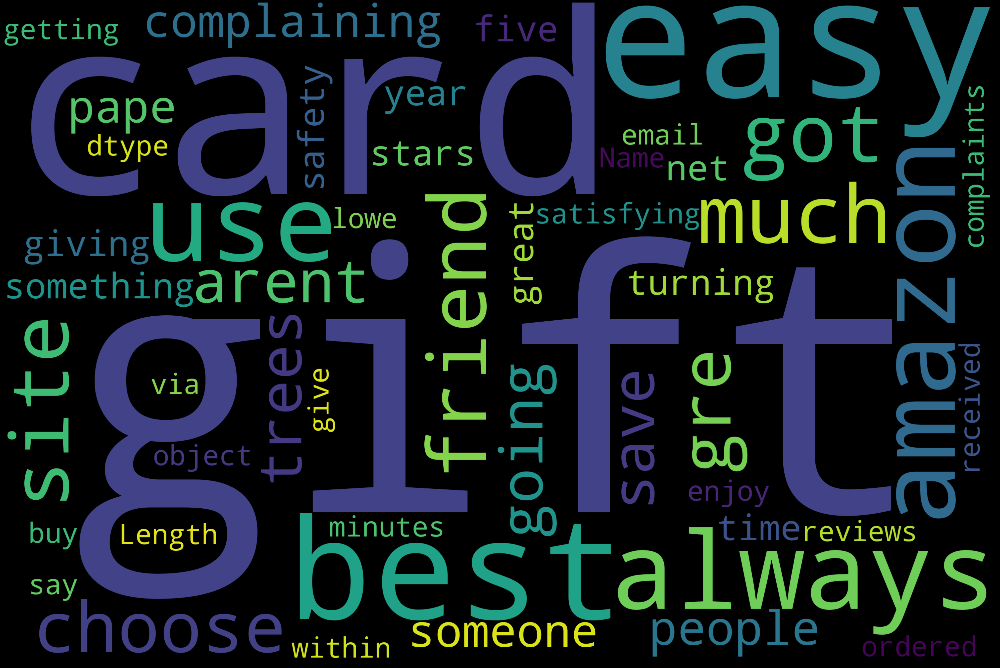

In [41]:
text = review_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Wordcloud-Neutral-Positive reviews

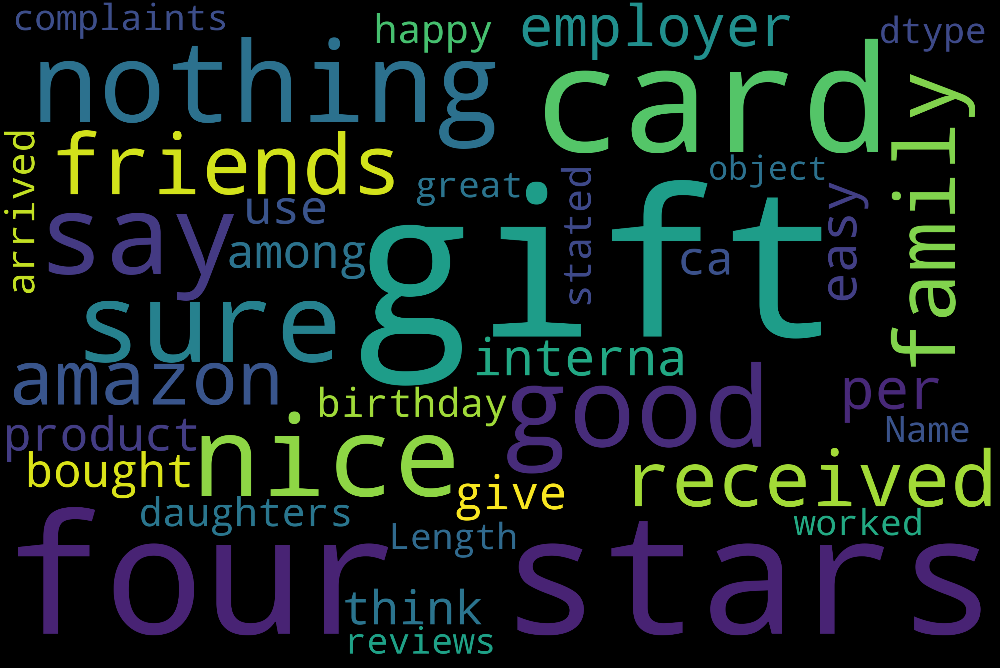

In [42]:
text = review_neu_pos["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Wordcloud-Neutral reviews

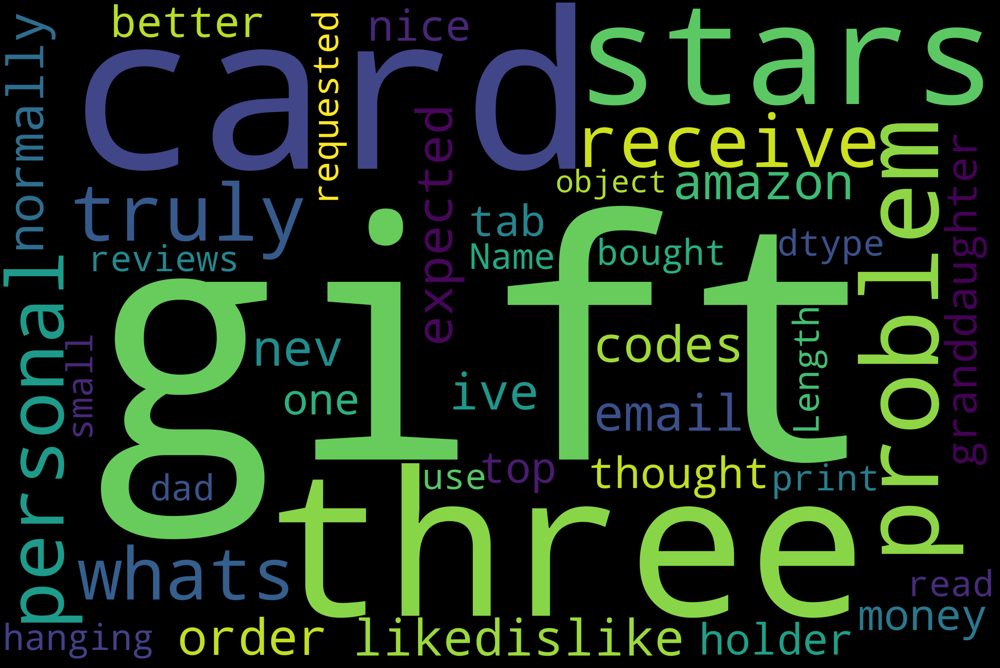

In [43]:
text = review_neu["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Wordcloud-Neutral-Negative reviews

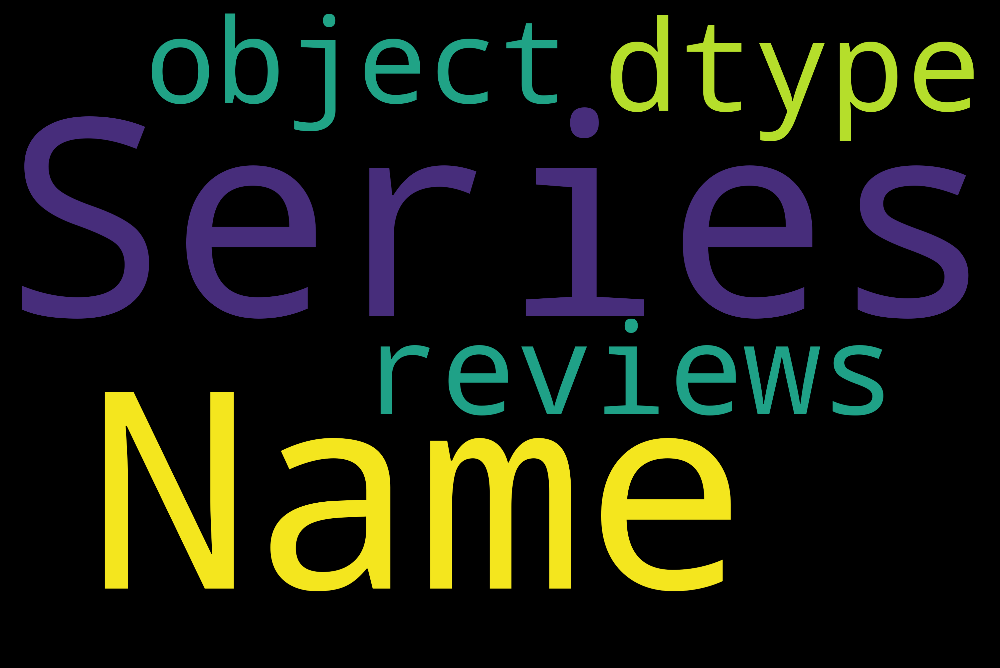

In [44]:
text = review_neu_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = STOPWORDS).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Wordcloud-Negative reviews

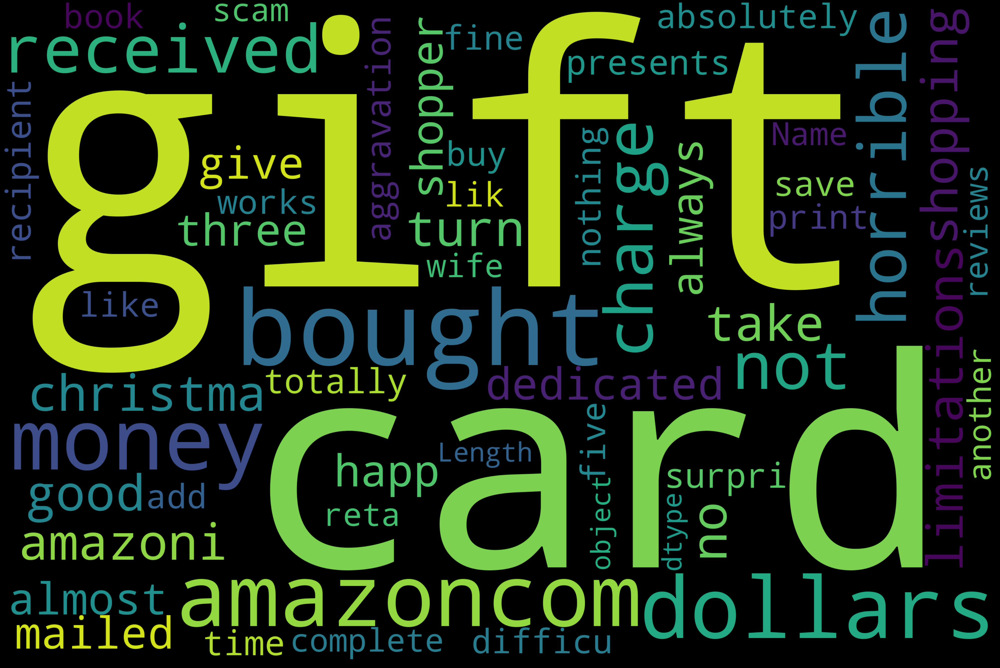

In [45]:
text = review_neg["reviews"]
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = stop_words).generate(str(text))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

## Encoding target variable-sentiment

In [46]:
# calling the label encoder function
label_encoder = preprocessing.LabelEncoder() 
  
# Encode labels in column 'sentiment'. 
process_reviews['sentiment']= label_encoder.fit_transform(process_reviews['sentiment']) 
  
process_reviews['sentiment'].unique() 

array([0, 3, 1, 2])

In [47]:
process_reviews['sentiment'].value_counts()

3    126689
0      8809
2      8700
1      2996
Name: sentiment, dtype: int64

## Stemming the reviews
**Stemming is a method of deriving root word from the inflected word. Here we extract the reviews and convert the words in reviews to its root word. for example,**
* **Going->go**
* **Finally->fina**

In [48]:
#Extracting 'reviews' for processing
review_features=process_reviews.copy()
review_WN_features=process_reviews.copy()
review_features=review_features[['reviews']].reset_index(drop=True)
review_WN_features=review_WN_features[['reviews_nerRemoved']].reset_index(drop=True)
review_features.head()


,reviews
0,amazoni shopping amazoncom gift cards christma...
1,got gift card friend best site much choose gre...
2,arent going save trees people complaining pape...
3,always get someone something amazon safety net...
4,take dollars good money no limitations turn am...


In [49]:
review_WN_features.head()

,reviews_nerRemoved
0,cards gifts really disappointed choices isnt o...
1,got gift card friend best site much choose gre...
2,arent going save trees people complaining pape...
3,always get someone something amazon safety net...
4,take dollars good money no limitations turn am...


In [50]:
#Performing stemming on the review dataframe
ps = PorterStemmer()

#splitting and adding the stemmed words except stopwords
corpus = []
for i in range(0, len(review_features)):
    review = re.sub('[^a-zA-Z]', ' ', review_features['reviews'][i])
    review = review.split()
    review = [ps.stem(word) for word in review if not word in stop_words]
    review = ' '.join(review)
    corpus.append(review)   

corpus_WN = []
for i in range(0, len(review_WN_features)):
    review = re.sub('[^a-zA-Z]', ' ', review_WN_features['reviews_nerRemoved'][i])
    review = review.split()
    review = [ps.stem(word) for word in review if not word in stop_words]
    review = ' '.join(review)
    corpus_WN.append(review)  

In [51]:
corpus[0]

'amazoni shop amazoncom gift card christma gift realli disappoint five choic isnt one say merri christma mention christma sure not alon want card reflect actual holiday celebr principl cannot send amazon gift card christma what polit correct bad market decisionlynn merri christma'

In [52]:
corpus_WN[0]

'card gift realli disappoint choic isnt one say merri mention sure not alon want card reflect actual holiday celebr principl cannot send amazon gift card what polit correct bad market decisionlynn merri christma'

## TFIDF(Term Frequency — Inverse Document Frequency)

In [53]:
tfidf_vectorizer = TfidfVectorizer(max_features=5000,ngram_range=(2,2))
# TF-IDF feature matrix
X= tfidf_vectorizer.fit_transform(review_features['reviews'])
X_withoutNer= tfidf_vectorizer.fit_transform(review_WN_features['reviews_nerRemoved'])

In [54]:
X.shape

(147194, 5000)

In [55]:
X_withoutNer.shape

(147194, 5000)

In [56]:
#Getting the target variable(encoded)
y=process_reviews['sentiment']
y.head()

0    0
1    3
2    3
3    3
4    0
Name: sentiment, dtype: int32

## Handling Imbalance target feature-SMOTE

In [57]:
print(f'Original dataset shape : {Counter(y)}')

smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X, y)
X_wn_res, y_wn_res = smote.fit_resample(X_withoutNer, y)

print(f'Resampled dataset shape {Counter(y_res)}')
print(f'Resampled dataset shape {Counter(y_wn_res)}')

Original dataset shape : Counter({3: 126689, 0: 8809, 2: 8700, 1: 2996})
Resampled dataset shape Counter({0: 126689, 3: 126689, 1: 126689, 2: 126689})
Resampled dataset shape Counter({0: 126689, 3: 126689, 1: 126689, 2: 126689})


# Model Building: Sentiment Analysis

## Model selection

In [58]:
#creating the objects
logreg_cv = LogisticRegression(random_state=123)
knn_cv=KNeighborsClassifier()
nb_cv=BernoulliNB()
cv_dict = {0: 'Logistic Regression',1:'KNN',2:'Naive Bayes'}
cv_models=[logreg_cv,knn_cv,nb_cv]

print("With Ners")
for i,model in enumerate(cv_models):
    print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, X, y, cv=5, scoring ='accuracy').mean()))
print("----------------")
print("Without Ners")
for i,model in enumerate(cv_models):
    print("{} Test Accuracy: {}".format(cv_dict[i],cross_val_score(model, X_withoutNer, y, cv=5, scoring ='accuracy').mean()))

With Ners
Logistic Regression Test Accuracy: 0.9260500263134489
KNN Test Accuracy: 0.7335358340030519
Naive Bayes Test Accuracy: 0.8982772321197986
----------------
Without Ners
Logistic Regression Test Accuracy: 0.8907088669494874
KNN Test Accuracy: 0.8139737626532801
Naive Bayes Test Accuracy: 0.8643016057313684


## Logistic Regression and LinearRegression

In [59]:
## Divide the dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.25, random_state=123,shuffle=1)
X_wn_train, X_wn_test, y_wn_train, y_wn_test = train_test_split(X_wn_res, y_wn_res, test_size=0.25, random_state=123,shuffle=1)

In [60]:
clf = LogisticRegression(random_state=123)
best_model = clf.fit(X_train,y_train)
print("The mean accuracy With Ners:",best_model.score(X_test,y_test))

The mean accuracy With Ners: 0.8107807307658913


In [61]:
clf = LogisticRegression(random_state=123)
best_model_WN = clf.fit(X_wn_train,y_wn_train)
print("The mean accuracy Without Ners:",best_model_WN.score(X_wn_test,y_wn_test))

The mean accuracy Without Ners: 0.6541925502608751


In [62]:
linearRegression = LinearRegression()
best_model = linearRegression.fit(X_train,y_train)
print("The mean accuracy With Ners:",best_model.score(X_test,y_test))

The mean accuracy With Ners: 0.7024399863563013


In [63]:
linearRegression = LinearRegression()
best_model_WN = linearRegression.fit(X_wn_train,y_wn_train)
print("The mean accuracy Without Ners:",best_model_WN.score(X_wn_test,y_wn_test))

The mean accuracy Without Ners: 0.5920443658024146


In [64]:
logreg = LogisticRegression(random_state=123)
logreg.fit(X_train, y_train)
y_pred = logreg.predict(X_wn_test)
print('Accuracy of logistic regression classifier on test set: {:.5f}'.format(logreg.score(X_test, y_test)))

Accuracy of logistic regression classifier on test set: 0.81078


In [65]:
logreg = LogisticRegression(random_state=123)
logreg.fit(X_wn_train,y_wn_train)
y_wn_pred = logreg.predict(X_wn_test)
print('Accuracy of logistic regression classifier on test set: {:.5f}'.format(logreg.score(X_wn_test, y_wn_test)))

Accuracy of logistic regression classifier on test set: 0.65419


## Classification metrics

In [66]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i in range (cm.shape[0]):
        for j in range (cm.shape[1]):
            plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Confusion matrix, without normalization


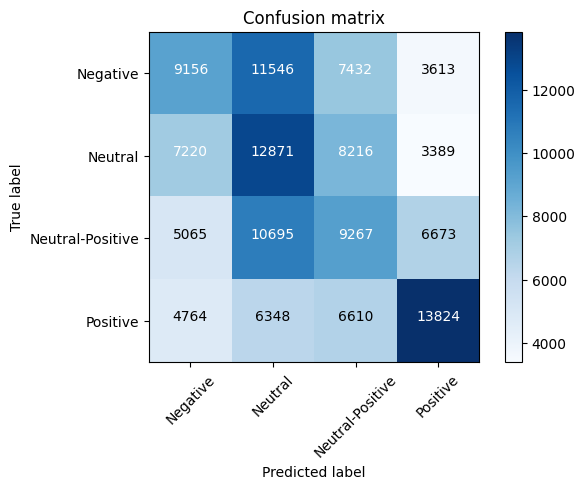

In [67]:
cm = metrics.confusion_matrix(y_test, y_pred)
plot_confusion_matrix(cm, classes=['Negative','Neutral','Neutral-Positive','Positive'])

In [68]:
print("Classification Report:\n",classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.35      0.29      0.32     31747
           1       0.31      0.41      0.35     31696
           2       0.29      0.29      0.29     31700
           3       0.50      0.44      0.47     31546

    accuracy                           0.36    126689
   macro avg       0.36      0.36      0.36    126689
weighted avg       0.36      0.36      0.36    126689



## ROC-AUC curve

In [69]:
#Binarizing the target feature
y = label_binarize(y, classes=[0, 1, 2])
n_classes = y.shape[1]

#Train-Test split(80:20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2,
                                                    random_state=0)

#OneVsRestClassifier
classifier = OneVsRestClassifier(svm.SVC(kernel='linear', probability=True,
                                 random_state=10))
y_score = classifier.fit(X_train, y_train).decision_function(X_test)

#Computing TPR and FPR
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
# aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Plot all ROC curves
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'cornflowerblue'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=4,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=4)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()